# 05 - SARIMAX

Implementation of SARIMAX model

In [1]:
# Import basic modules
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
from matplotlib import rcParams

from datetime import datetime
from datetime import timedelta

# Import regression and error metrics modules
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Import plotly modules to view time series in a more interactive way
import plotly.graph_objects as go
import pandas as pd

# Standard scaler for preprocessing
from sklearn.preprocessing import StandardScaler

# Importing time series split for cross validation 
from sklearn.model_selection import TimeSeriesSplit

plt.style.use('bmh')

# special IPython command to prepare the notebook for matplotlib and other libraries
%matplotlib inline 


# Load specific forecasting tools
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsmodels.graphics.tsaplots import plot_acf,plot_pacf # for determining (p,q) orders
from statsmodels.tsa.seasonal import seasonal_decompose      # for ETS Plots
from pmdarima import auto_arima                              # for determining ARIMA orders

# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
#df = pd.read_csv('Data_Model.csv', index_col = 'Date', infer_datetime_format=True)
df = pd.read_csv('Data_Forecasting.csv', index_col = 'Date', parse_dates=True)
#df = pd.read_csv('Data_Forecasting.csv',  parse_dates=True)
df.index.asfreq = 'H'
df.head(3)

,PowerAvg
Date,
2011-08-01 00:00:00,0.0
2011-08-01 01:00:00,0.0
2011-08-01 02:00:00,0.0


In [3]:
df.shape

(21218, 1)

In [4]:
#pd.date_range(df.index.min(), df.index.max(), freq='H').difference(df.index)

In [5]:
df = df.dropna()

In [6]:
df.index

DatetimeIndex(['2011-08-01 00:00:00', '2011-08-01 01:00:00',
               '2011-08-01 02:00:00', '2011-08-01 03:00:00',
               '2011-08-01 04:00:00', '2011-08-01 05:00:00',
               '2011-08-01 06:00:00', '2011-08-01 07:00:00',
               '2011-08-01 08:00:00', '2011-08-01 09:00:00',
               ...
               '2013-12-31 14:00:00', '2013-12-31 15:00:00',
               '2013-12-31 16:00:00', '2013-12-31 17:00:00',
               '2013-12-31 18:00:00', '2013-12-31 19:00:00',
               '2013-12-31 20:00:00', '2013-12-31 21:00:00',
               '2013-12-31 22:00:00', '2013-12-31 23:00:00'],
              dtype='datetime64[ns]', name='Date', length=21218, freq=None)

### Seasonal decompose of dependent variable
Seasonality refers to the repetition of pattern over the period on fixed time intervals such as time of day, daily, weekly, monthly, yearly.  

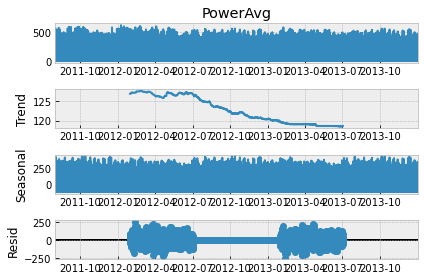

In [7]:
result = seasonal_decompose(df["PowerAvg"], model='add', freq = 24*365)
result.plot();

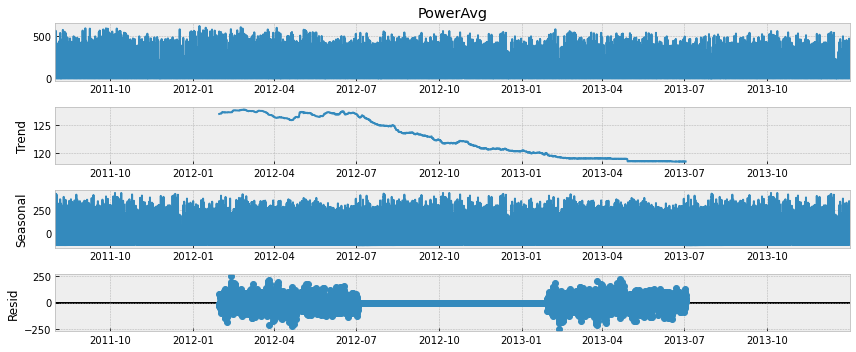

In [8]:
from pylab import rcParams
rcParams['figure.figsize'] = 12,5
result.plot();

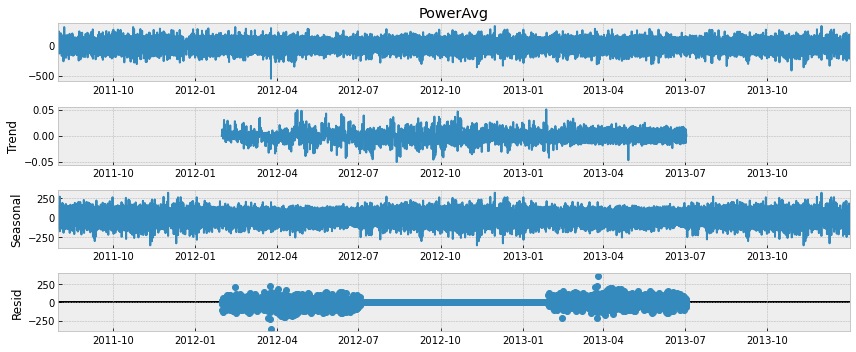

In [9]:
decomp_diff1 = seasonal_decompose(df['PowerAvg'].diff().dropna(), freq=24*365) 
_ = decomp_diff1.plot()

***
* To deal with seasonality we can difference the dataset with the periodicity of the seasons. Let's difference the dataset by its smallest period which is 24 hours here. 

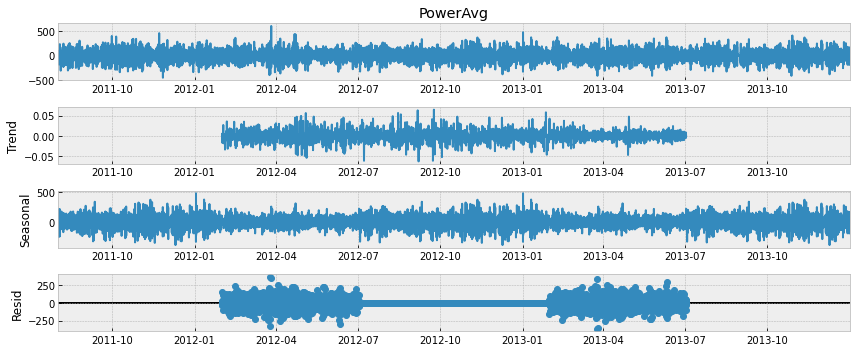

In [10]:
# Differencing the data with periodicity of 24 hours in addition to the original single differencing

decomp_diff24 = seasonal_decompose(df['PowerAvg'].diff().dropna().diff(24).dropna(), freq=24*365) 
_ = decomp_diff24.plot()

#### Conducting the Dicky Fuller test of Stationarity

In [11]:
from statsmodels.tsa.stattools import adfuller

In [12]:
def run_adfuller(ts):
    result = adfuller(ts)
    # Print test statistic
    print("t-stat", result[0])
    # Print p-value
    print("p-value", result[1])
    # Print #lags used
    print("#lags used", result[2])
    # Print critical values
    print("critical values", result[4]) 

In [13]:
print("for no differencing\n")
run_adfuller(df['PowerAvg'])
print("\nfor single differencing\n")
run_adfuller(df['PowerAvg'].diff().dropna())
print("\nfor differenced data set over lags 24 after single differencing\n")
run_adfuller(df['PowerAvg'].diff().dropna().diff(24).dropna())

for no differencing

t-stat -13.615336138717112
p-value 1.8397243589752354e-25
#lags used 46
critical values {'1%': -3.4306589175312583, '5%': -2.861676531107642, '10%': -2.566842671705706}

for single differencing

t-stat -42.07866240059662
p-value 0.0
#lags used 46
critical values {'1%': -3.430658932125259, '5%': -2.8616765375573614, '10%': -2.56684267513877}

for differenced data set over lags 24 after single differencing

t-stat -25.61556341393241
p-value 0.0
#lags used 46
critical values {'1%': -3.4306592827954256, '5%': -2.861676692533649, '10%': -2.5668427576297344}


In [14]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted power kW values using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [15]:
# Defining a function to plot exponentially smoothed data
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()
    
    plot_ts_pred(ts, expw_ma, model_name='Exponentially smoothed data with alpha = {}'.format(alpha), \
                 og_ts_opacity = 0.5, pred_ts_opacity = 0.5)


In [16]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.7
plot_ewma(df['PowerAvg'], 0.7)

In [17]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.3
plot_ewma(df['PowerAvg'], 0.3)

In [18]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.8
plot_ewma(df['PowerAvg'], 0.8)

#### Plotting the ACF and PACF plots

In [19]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [20]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

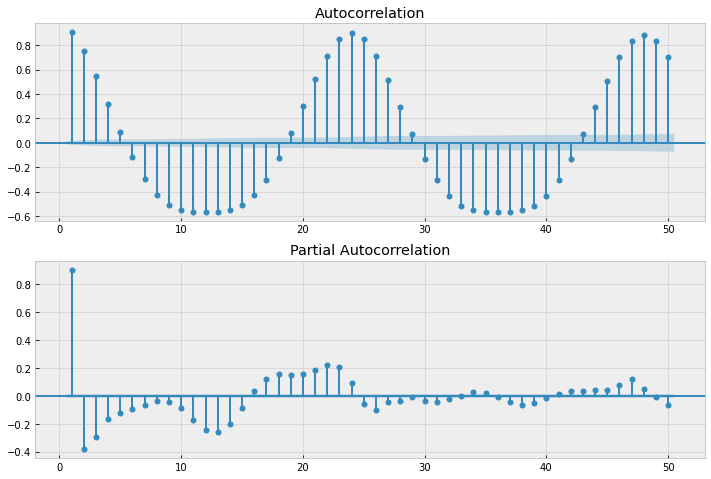

In [21]:
# Create the acf and pacf plots

dfacf = []
dfacf = df['PowerAvg']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

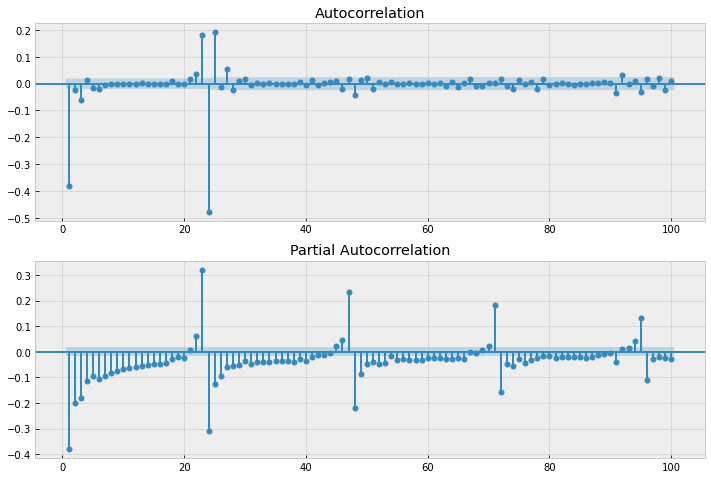

In [22]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = df['PowerAvg']
dfacf = dfacf.diff().dropna() 
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24*365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

***
## Handling Multiple seasonality <a name="6.2"></a>
***


In [23]:
df1 = pd.read_csv('Data_Model.csv', index_col = 'Date', parse_dates=True)
df1.head(3)

,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg
Date,,,,,,,,,,,,,,,
2011-08-01 00:00:00,2011,8,1,0,4.0,WSW,6.2,WSW,0.0,0.0,0.0,0.0,25.00,22.016667,0.0
2011-08-01 01:00:00,2011,8,1,1,4.5,WSW,14.0,WSW,0.0,0.0,0.0,0.0,24.80,22.083333,0.0
2011-08-01 02:00:00,2011,8,1,2,4.0,WSW,6.6,W,0.0,0.0,0.0,0.0,24.95,22.308333,0.0


In [24]:
df1.tail(3)

,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg
Date,,,,,,,,,,,,,,,
2013-12-31 21:00:00,2013,12,31,21,2.9,ENE,5.3,ENE,0.0,0.0,0.0,0.0,25.6,22.666667,0.0
2013-12-31 22:00:00,2013,12,31,22,2.7,NE,4.7,ENE,0.0,0.0,0.0,0.0,25.3,22.466667,0.0
2013-12-31 23:00:00,2013,12,31,23,3.5,NE,5.3,NNE,0.0,0.0,0.0,0.0,24.9,22.300000,0.0


In [25]:
# Dividing the hours into 2 groups-> daytime, night
hour_dict = {'daytime': list(np.arange(6,19)), 'night': [19,20,21,22,23,24,1,2,3,4,5]}
hour_dict

{'daytime': [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18],
 'night': [19, 20, 21, 22, 23, 24, 1, 2, 3, 4, 5]}

In [26]:
def time_of_day(x):
    if x in hour_dict['daytime']:
        return 'daytime'
    else:
        return 'night'

In [27]:
df1['Time_of_Day'] = df1['Hour'].apply(time_of_day)

In [28]:
# creating categorical columns for regression 
cat_cols1 = ['Year','Month', 'Day', 'Time_of_Day']

for col in cat_cols1:
    df1[col] = df1[col].astype('category')

In [29]:
# Columns to use for regression
cols_use = ['PowerAvg','Year','Month', 'Day', 'Time_of_Day','MeanWS','MaxGustWS','Precipitation','GlobalSolarRadiation','TiltSolarIrradiance',
                     'DiffuseSolarIrradiance','OpenAirTempAvg','ModuleTempAvg']

In [30]:
df1_lin = pd.get_dummies(df1[cols_use ], drop_first = True)

In [31]:
# Adding max 24 lags; lag1 is the value of the power generation in the previous hour, lag2 is the value of power generation..
#..2 hours before the current value and so on.

# Creating the lag variables
for i in range(24):
    df1_lin['lag'+str(i+1)] = df1_lin['PowerAvg'].shift(i+1)

In [32]:
# Since the first 24 values won't have any 24th lag, they will be NaN. So dropping the NaNs
lag_df1_lin = df1_lin.dropna()

In [33]:
lag_df1_lin.head(3)

,PowerAvg,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,Year_2012,...,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Date,,,,,,,,,,,,,,,,,,,,,
2011-08-02 00:00:00,0.0,3.4,6.2,0.0,0.0,0.0,0.0,25.6,22.850000,0,...,280.0,139.5,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-08-02 01:00:00,0.0,4.5,13.2,0.0,0.0,0.0,0.0,25.4,22.575000,0,...,386.5,280.0,139.5,43.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-08-02 02:00:00,0.0,3.9,6.7,0.0,0.0,0.0,0.0,25.4,22.766667,0,...,328.5,386.5,280.0,139.5,43.0,0.0,0.0,0.0,0.0,0.0


In [34]:
lag_df1_lin.tail(3)

,PowerAvg,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,Year_2012,...,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Date,,,,,,,,,,,,,,,,,,,,,
2013-12-31 21:00:00,0.0,2.9,5.3,0.0,0.0,0.0,0.0,25.6,22.666667,0,...,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0
2013-12-31 22:00:00,0.0,2.7,4.7,0.0,0.0,0.0,0.0,25.3,22.466667,0,...,21.5,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0
2013-12-31 23:00:00,0.0,3.5,5.3,0.0,0.0,0.0,0.0,24.9,22.300000,0,...,77.0,21.5,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0


In [35]:
import warnings
warnings.filterwarnings('ignore')

def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to 
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for 
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """
    
    for k in range(1, year_k+1):
        # year has a period of 365.25 including the leap year
        df['year_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofyear/365.25) 
        df['year_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofyear/365.25)

    for k in range(1, week_k+1):
        
        # week has a period of 7
        df['week_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofweek/7)
        df['week_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofweek/7)


    for k in range(1, day_k+1):
        
        # day has period of 24
        df['hour_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.hour/24)
        df['hour_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.hour/24) 

In [36]:
warnings.filterwarnings('ignore')

# power generation time series k= 5 was chosen for each seasonality
add_fourier_terms(lag_df1_lin, year_k= 5, week_k=5 , day_k=5)

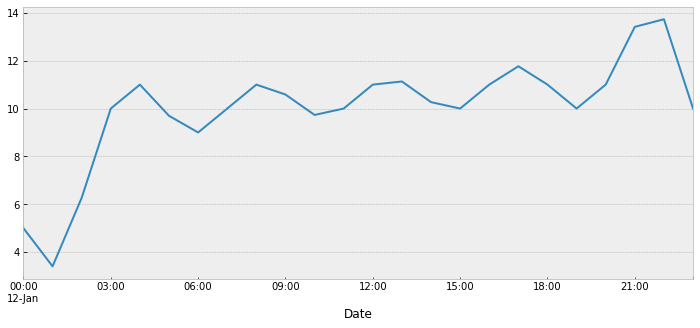

In [37]:
# Visualizing the new variables on hour seasonality
pd.plotting.register_matplotlib_converters()
_ = (1-lag_df1_lin.loc['01-12-2013':'01-12-2013', [col for col in lag_df1_lin if col.startswith('hour')]]).sum(axis = 1).plot()

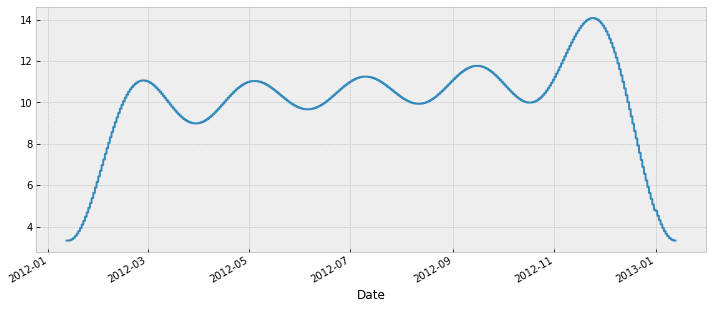

In [38]:
# Visualizing the new variables on year seasonality
_ = (1-lag_df1_lin.loc['01-12-2012':'01-12-2013', [col for col in lag_df1_lin if col.startswith('year')]]).sum(axis = 1).plot()

In [39]:
lag_df1_lin.columns

Index(['PowerAvg', 'MeanWS', 'MaxGustWS', 'Precipitation',
       'GlobalSolarRadiation', 'TiltSolarIrradiance', 'DiffuseSolarIrradiance',
       'OpenAirTempAvg', 'ModuleTempAvg', 'Year_2012',
       ...
       'hour_sin1', 'hour_cos1', 'hour_sin2', 'hour_cos2', 'hour_sin3',
       'hour_cos3', 'hour_sin4', 'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object', length=107)

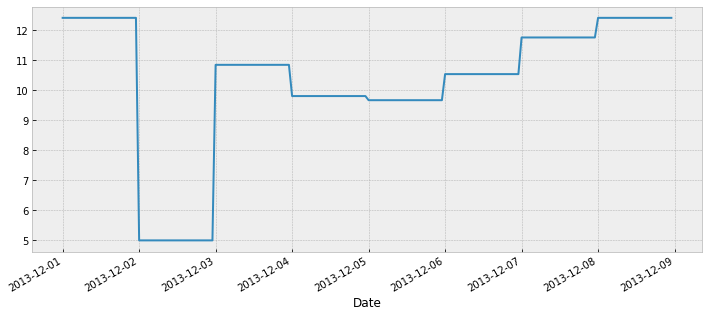

In [40]:
# Visualizing the new variables on week seasonality
_ = (1-lag_df1_lin.loc['12-01-2013':'12-08-2013', [col for col in lag_df1_lin if col.startswith('week')]]).sum(axis = 1).plot()

In [41]:
# Choosing a subset of the above dataframe; removing the lags and the hour bins
dfcyc = lag_df1_lin.drop([col for col in lag_df1_lin if 
                         col.startswith('Time') or col.startswith('lag')], axis=1)

In [42]:
dfcyc.tail(3)

,PowerAvg,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,Year_2012,...,hour_sin1,hour_cos1,hour_sin2,hour_cos2,hour_sin3,hour_cos3,hour_sin4,hour_cos4,hour_sin5,hour_cos5
Date,,,,,,,,,,,,,,,,,,,,,
2013-12-31 21:00:00,0.0,2.9,5.3,0.0,0.0,0.0,0.0,25.6,22.666667,0,...,-0.707107,0.707107,-1.000000,-4.286264e-16,-0.707107,-7.071068e-01,8.572528e-16,-1.0,0.707107,-0.707107
2013-12-31 22:00:00,0.0,2.7,4.7,0.0,0.0,0.0,0.0,25.3,22.466667,0,...,-0.500000,0.866025,-0.866025,5.000000e-01,-1.000000,1.102801e-15,-8.660254e-01,-0.5,-0.500000,-0.866025
2013-12-31 23:00:00,0.0,3.5,5.3,0.0,0.0,0.0,0.0,24.9,22.300000,0,...,-0.258819,0.965926,-0.500000,8.660254e-01,-0.707107,7.071068e-01,-8.660254e-01,0.5,-0.965926,0.258819


***
## 6.3. SARIMAX <a name="6.3"></a>
***

__Trying the SARIMAX model on the above fourier series added dataset__

In [43]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [44]:
import pmdarima as pm

In [45]:
dfcyc.columns

Index(['PowerAvg', 'MeanWS', 'MaxGustWS', 'Precipitation',
       'GlobalSolarRadiation', 'TiltSolarIrradiance', 'DiffuseSolarIrradiance',
       'OpenAirTempAvg', 'ModuleTempAvg', 'Year_2012', 'Year_2013', 'Month_2',
       'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7', 'Month_8',
       'Month_9', 'Month_10', 'Month_11', 'Month_12', 'Day_2', 'Day_3',
       'Day_4', 'Day_5', 'Day_6', 'Day_7', 'Day_8', 'Day_9', 'Day_10',
       'Day_11', 'Day_12', 'Day_13', 'Day_14', 'Day_15', 'Day_16', 'Day_17',
       'Day_18', 'Day_19', 'Day_20', 'Day_21', 'Day_22', 'Day_23', 'Day_24',
       'Day_25', 'Day_26', 'Day_27', 'Day_28', 'Day_29', 'Day_30', 'Day_31',
       'year_sin1', 'year_cos1', 'year_sin2', 'year_cos2', 'year_sin3',
       'year_cos3', 'year_sin4', 'year_cos4', 'year_sin5', 'year_cos5',
       'week_sin1', 'week_cos1', 'week_sin2', 'week_cos2', 'week_sin3',
       'week_cos3', 'week_sin4', 'week_cos4', 'week_sin5', 'week_cos5',
       'hour_sin1', 'hour_cos1', 'hour_sin2', '

In [46]:
dfcyc.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 21194 entries, 2011-08-02 00:00:00 to 2013-12-31 23:00:00
Data columns (total 82 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   PowerAvg                21194 non-null  float64
 1   MeanWS                  21194 non-null  float64
 2   MaxGustWS               21194 non-null  float64
 3   Precipitation           21194 non-null  float64
 4   GlobalSolarRadiation    21194 non-null  float64
 5   TiltSolarIrradiance     21194 non-null  float64
 6   DiffuseSolarIrradiance  21194 non-null  float64
 7   OpenAirTempAvg          21194 non-null  float64
 8   ModuleTempAvg           21194 non-null  float64
 9   Year_2012               21194 non-null  uint8  
 10  Year_2013               21194 non-null  uint8  
 11  Month_2                 21194 non-null  uint8  
 12  Month_3                 21194 non-null  uint8  
 13  Month_4                 21194 non-null  uint8  
 14  Mon

In [47]:
def train_test(data, test_size = 0.15, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'PowerAvg' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('PowerAvg', axis = 1).iloc[:test_index]
    y_train = df.PowerAvg.iloc[:test_index]
    X_test = df.drop('PowerAvg', axis = 1).iloc[test_index:]
    y_test = df.PowerAvg.iloc[test_index:]
    
    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test

In [48]:
# Creating the training and test datasets

cols_to_transform = ['MeanWS', 'MaxGustWS', 'Precipitation', 'GlobalSolarRadiation',
       'TiltSolarIrradiance', 'DiffuseSolarIrradiance', 'OpenAirTempAvg',
       'ModuleTempAvg',]  
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(dfcyc, 
                                                              test_size = 0.15, scale = True, 
                                                              cols_to_transform=cols_to_transform)

# Since SARIMA model uses the past lag y values, scaling the power values as well. 
#i.e. fit the scaler on y_train and transform it and also transform y_test using the same scaler if required later

scaler1 = StandardScaler()
y_train_lag = pd.DataFrame(scaler1.fit_transform(y_train_lag.values.reshape(-1,1)), index = y_train_lag.index, 
                           columns = ['PowerAvg'])
# y_test_lag = scaler1.transform(y_test_lag)

In [49]:
X_test_lag.head(3)

,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,Year_2012,Year_2013,...,hour_sin1,hour_cos1,hour_sin2,hour_cos2,hour_sin3,hour_cos3,hour_sin4,hour_cos4,hour_sin5,hour_cos5
Date,,,,,,,,,,,,,,,,,,,,,
2013-08-21 13:00:00,2.455922,1.813260,-0.105621,2.309912,2.119642,0.813990,2.117748,1.717310,0,1,...,-0.258819,-0.965926,0.500000,8.660254e-01,-0.707107,-7.071068e-01,8.660254e-01,0.5,-0.965926,-0.258819
2013-08-21 14:00:00,1.863716,1.975138,-0.105621,1.604251,1.511914,1.044370,1.988607,1.196269,0,1,...,-0.500000,-0.866025,0.866025,5.000000e-01,-1.000000,-4.286264e-16,8.660254e-01,-0.5,-0.500000,0.866025
2013-08-21 15:00:00,2.209170,1.759301,-0.105621,0.950224,0.940469,1.447534,1.811038,0.986802,0,1,...,-0.707107,-0.707107,1.000000,1.194340e-15,-0.707107,7.071068e-01,2.388680e-15,-1.0,0.707107,0.707107


In [50]:
X_test_lag.tail(3)

,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,Year_2012,Year_2013,...,hour_sin1,hour_cos1,hour_sin2,hour_cos2,hour_sin3,hour_cos3,hour_sin4,hour_cos4,hour_sin5,hour_cos5
Date,,,,,,,,,,,,,,,,,,,,,
2013-12-31 21:00:00,-0.406406,-0.506984,-0.105621,-0.727872,-0.746656,-0.74107,-0.481211,-0.741493,0,1,...,-0.707107,0.707107,-1.000000,-4.286264e-16,-0.707107,-7.071068e-01,8.572528e-16,-1.0,0.707107,-0.707107
2013-12-31 22:00:00,-0.505107,-0.668861,-0.105621,-0.727872,-0.746656,-0.74107,-0.578066,-0.759511,0,1,...,-0.500000,0.866025,-0.866025,5.000000e-01,-1.000000,1.102801e-15,-8.660254e-01,-0.5,-0.500000,-0.866025
2013-12-31 23:00:00,-0.110303,-0.506984,-0.105621,-0.727872,-0.746656,-0.74107,-0.707207,-0.774527,0,1,...,-0.258819,0.965926,-0.500000,8.660254e-01,-0.707107,7.071068e-01,-8.660254e-01,0.5,-0.965926,0.258819


In [51]:
# Got the optimal SARIMAX order from running the above auto_arima function. It took more than 2 hours to get the optimal...
#...solution. So, just using the final values here
model_opt = SARIMAX(y_train_lag, order=(2,1,1), seasonal_order=(1, 0, 1, 24), exog = X_train_lag, trend='c')

In [52]:
results = model_opt.fit()

In [53]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                           PowerAvg   No. Observations:                18014
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 24)   Log Likelihood                1919.907
Date:                            Mon, 27 Jun 2022   AIC                          -3663.814
Time:                                    16:55:38   BIC                          -2977.515
Sample:                                         0   HQIC                         -3438.135
                                          - 18014                                         
Covariance Type:                              opg                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
intercept              -9.481e-06      0.001     -0.007      0.994      -0.003       0.003
MeanWS                     0.0268      0.004      6.609      0.000       0.019       0.035
MaxGustWS                  0.0032      0.004      0.783      0.434      -0.005       0.011
Precipitation             -0.0013      0.002     -0.719      0.472      -0.005       0.002
GlobalSolarRadiation      -0.2503      0.032     -7.703      0.000      -0.314      -0.187
TiltSolarIrradiance        0.7185      0.034     21.144      0.000       0.652       0.785
DiffuseSolarIrradiance     0.1073      0.003     32.171      0.000       0.101       0.114
OpenAirTempAvg             0.0331      0.009      3.833      0.000       0.016       0.050
ModuleTempAvg              0.1530      0.009     17.669      0.000       0.136       0.170
Year_2012                  0.6724     22.240      0.030      0.976     -42.918      44.262
Year_2013                  1.3177     44.478      0.030      0.976     -85.858      88.493
Month_2                    0.0639      1.902      0.034      0.973      -3.664       3.791
Month_3                    0.1151      3.638      0.032      0.975      -7.016       7.246
Month_4                    0.1553      5.522      0.028      0.978     -10.668      10.978
Month_5                    0.2326      7.345      0.032      0.975     -14.164      14.629
Month_6                    0.2842      9.230      0.031      0.975     -17.805      18.374
Month_7                    0.3219     11.054      0.029      0.977     -21.344      21.987
Month_8                    0.3993     12.937      0.031      0.975     -24.956      25.754
Month_9                    0.4301     14.820      0.029      0.977     -28.616      29.476
Month_10                   0.4939     16.642      0.030      0.976     -32.124      33.112
Month_11                   0.5398     18.529      0.029      0.977     -35.776      36.856
Month_12                   0.5959     20.353      0.029      0.977     -39.295      40.487
Day_2                     -0.0017      0.076     -0.022      0.982      -0.151       0.148
Day_3                     -0.0078      0.134     -0.058      0.954      -0.270       0.254
Day_4                      0.0076      0.194      0.039      0.969      -0.374       0.389
Day_5                      0.0224      0.254      0.088      0.930      -0.476       0.521
Day_6                      0.0167      0.315      0.053      0.958      -0.600       0.634
Day_7                   4.023e-05      0.374      0.000      1.000      -0.734       0.734
Day_8                      0.0070      0.435      0.016      0.987      -0.846       0.860
Day_9                      0.0092      0.496      0.019      0.985      -0.962       0.981
Day_10                     0.0382      0.556      0.069      0.945      -1.051       1.128
Day_11                     0.0158      

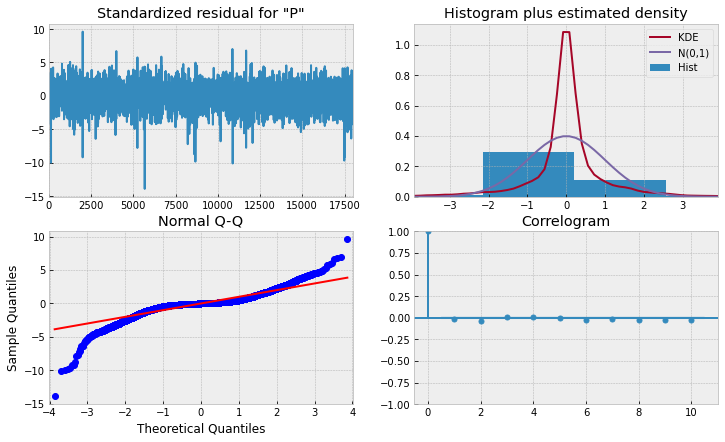

In [54]:
# plotting the residuals and checking if they meet the i.i.d requirements
_ = results.plot_diagnostics(figsize=(12, 7))

In [55]:
# Predictions on train set. Predicting only the last week of the training set

pred = results.get_prediction(start=X_train_lag.index[-24*7], end=X_train_lag.index[-1], 
                              dynamic=True, exog=X_train_lag.iloc[-24*7:, :])
pred_ci = pred.conf_int()

pred1 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci1 = scaler1.inverse_transform(pred.conf_int())

y_actual_train = np.squeeze(scaler1.inverse_transform(y_train_lag))
y_actual_train = pd.Series(y_actual_train, index = X_train_lag.index )

pred1 = pd.Series(pred1, index = X_train_lag.iloc[-24*7:, :].index )
pred_ci1 = pd.DataFrame(pred_ci1, index = pred1.index, columns = ['lower Power', 'upper Power'])

lower_limits = pred_ci1.loc[:,'lower Power']
upper_limits = pred_ci1.loc[:,'upper Power']

In [56]:
# Creating an empty dict to save all the erros from different models
dict_error = dict()

In [57]:
def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score, 
    MAE (mean absolute error)
    
    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
    
    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with 
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2 )

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

In [58]:
# Error on training set for 1 week ahead forecast
error_metrics(pred1, y_actual_train.iloc[-24*7:], 'SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week', 
              test=False) 


Error metrics for model SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week
RMSE or Root mean squared error: 41.22
Variance score: 0.93
Mean Absolute Error: 31.42


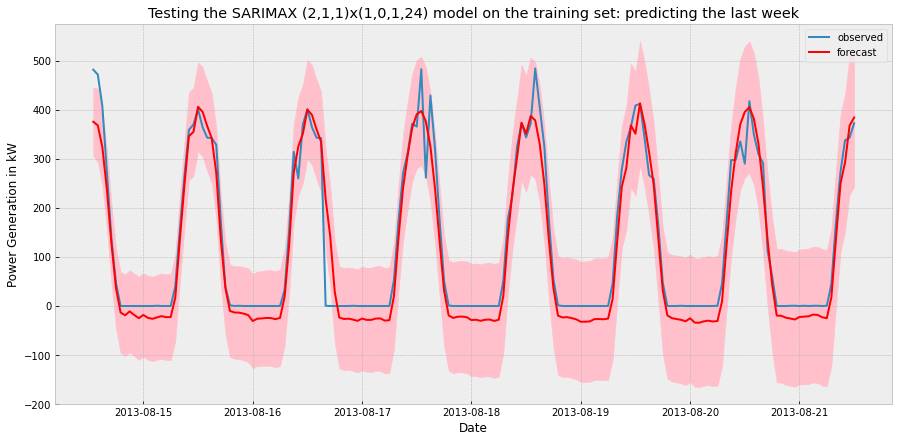

In [59]:
#plot_ts_pred(y_actual_train.iloc[-24*7:], pred1 , model_name='SARIMA (0,1,2)x(1,0,1,24)', 
#             og_ts_opacity = 0.5, pred_ts_opacity = 0.5)
# plot the predictions
plt.figure(figsize = (15,7))
_ = plt.plot(y_actual_train.iloc[-24*7:].index, y_actual_train.iloc[-24*7:], label='observed')

# plot your mean predictions
_ = plt.plot(pred1.index, pred1.values, color='r', label='forecast')

# shade the area between confidence limits
_ = plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')

# set labels, legends and show plot
_ = plt.xlabel('Date')
_ = plt.ylabel('Power Generation in kW')
_ = plt.legend()
_ = plt.title('Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the training set: predicting the last week')

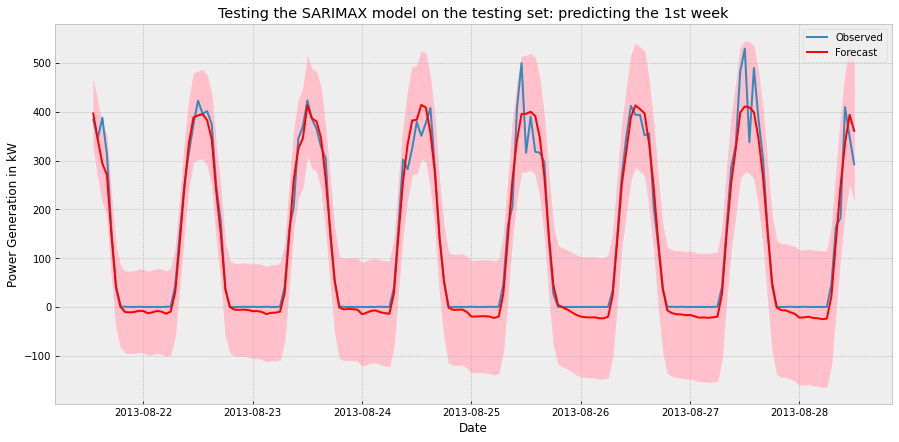

In [60]:
# Predictions on test set. Predicting only the 1st week of the test set
pred = results.get_forecast(steps = 24*7, exog = X_test_lag.iloc[:24*7, :])
pred_ci = pred.conf_int()

pred2 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci2 = scaler1.inverse_transform(pred.conf_int())

y_actual = y_test_lag.iloc[:24*7]

pred2 = pd.Series(pred2, index = X_test_lag.iloc[:24*7, :].index )
pred_ci2 = pd.DataFrame(pred_ci2, index = pred2.index, columns = ['lower Power', 'upper Power'])

lower_limits = pred_ci2.loc[:,'lower Power']
upper_limits = pred_ci2.loc[:,'upper Power']

# plot the predictions
plt.figure(figsize = (15,7))
_ = plt.plot(y_actual.index, y_actual, label='Observed')

# plot your mean predictions
_ = plt.plot(pred2.index, pred2.values, color='r', label='Forecast')

# shade the area between your confidence limits
_ = plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')

# set labels, legends and show plot
_ = plt.xlabel('Date')
_ = plt.ylabel('Power Generation in kW')
_ = plt.legend()
_ = plt.title('Testing the SARIMAX model on the testing set: predicting the 1st week')

In [61]:
error_metrics(pred2, y_actual, 'SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week', test=True) 


Error metrics for model SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week
RMSE or Root mean squared error: 30.16
Variance score: 0.97
Mean Absolute Error: 21.47


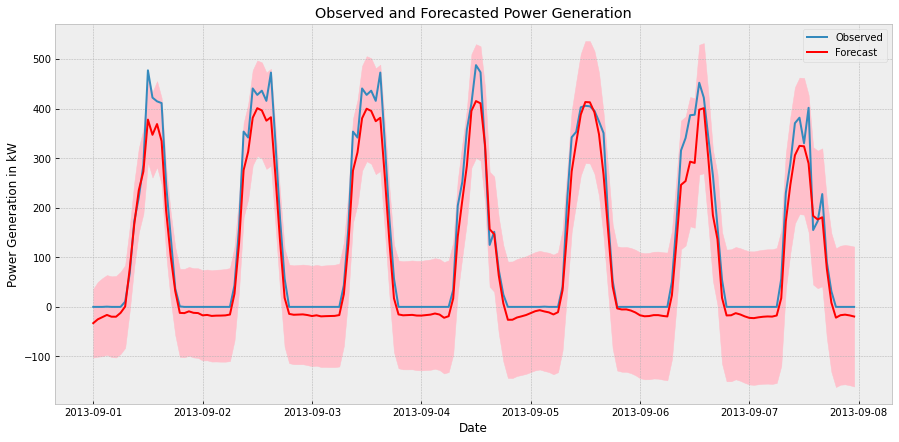

In [62]:
# Predictions on test set. Predicting only the 2nd week of the test set

pred = results.get_forecast(steps = 24*7, exog = X_test_lag.loc['2013-09-01':'2013-09-07', :])
pred_ci = pred.conf_int()

pred2 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci2 = scaler1.inverse_transform(pred.conf_int())

y_actual = y_test_lag.loc['2013-09-01':'2013-09-07']

pred2 = pd.Series(pred2, index = X_test_lag.loc['2013-09-01':'2013-09-07', :].index )
pred_ci2 = pd.DataFrame(pred_ci2, index = pred2.index, columns = ['lower Power', 'upper Power'])

lower_limits = pred_ci2.loc[:,'lower Power']
upper_limits = pred_ci2.loc[:,'upper Power']

# plot the predictions
plt.figure(figsize = (15,7))
_ = plt.plot(y_actual.index, y_actual, label='Observed')

# plot your mean predictions
_ = plt.plot(pred2.index, pred2.values, color='r', label='Forecast')

# shade the area between your confidence limits
_ = plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')

# set labels, legends and show plot
_ = plt.xlabel('Date')
_ = plt.ylabel('Power Generation in kW')
_ = plt.legend()
_ = plt.title('Observed and Forecasted Power Generation')

In [63]:
# Forecasting on test set. 

def forecast(start):
    """
    Forecast 7 days ahead power generation on test set
    """
    # taking the input as date
    startdate = datetime.strptime(start, "%Y-%m-%d")
    enddate = startdate + timedelta(days=7)
    
    exog = X_test_lag.loc[startdate:enddate, :]
    # drop last raw
    exog.drop(exog.tail(1).index, inplace=True)
    
    
    # get predictions
    pred = results.get_forecast(steps = 24*7, exog = exog)
    pred_ci = pred.conf_int()

    pred2 = scaler1.inverse_transform(pred.predicted_mean)
    pred_ci2 = scaler1.inverse_transform(pred.conf_int())

    y_actual = y_test_lag.loc[startdate:enddate]

    pred2 = pd.Series(pred2, index = exog.index )
    pred_ci2 = pd.DataFrame(pred_ci2, index = pred2.index, columns = ['lower Power', 'upper Power'])

    lower_limits = pred_ci2.loc[:,'lower Power']
    upper_limits = pred_ci2.loc[:,'upper Power']

    # plot the predictions
    plt.figure(figsize = (15,7))
    _ = plt.plot(y_actual.index, y_actual, label='Observed')

    # plot your mean predictions
    _ = plt.plot(pred2.index, pred2.values, color='r', label='Forecast')

    # shade the area between your confidence limits
    _ = plt.fill_between(lower_limits.index, lower_limits, upper_limits, color='pink')

    # set labels, legends and show plot
    _ = plt.xlabel('Date')
    _ = plt.ylabel('Power Generation in kW')
    _ = plt.legend()
    _ = plt.title('Observed and Forecasted Power Generation')

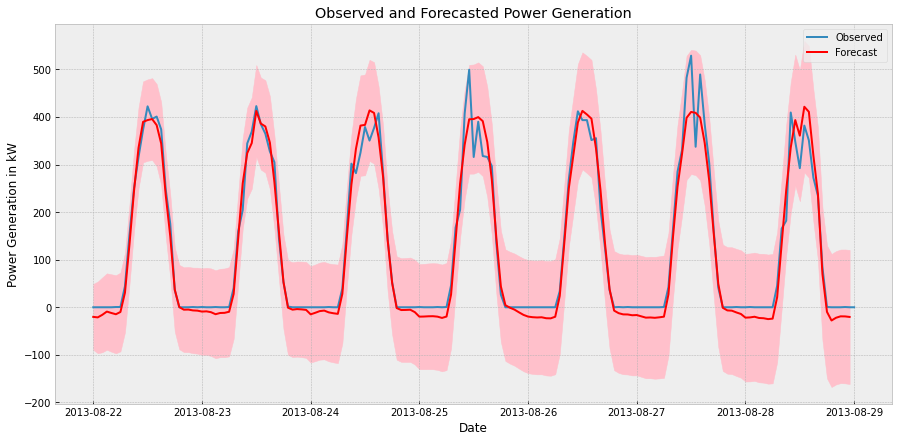

In [64]:
forecast('2013-08-22')

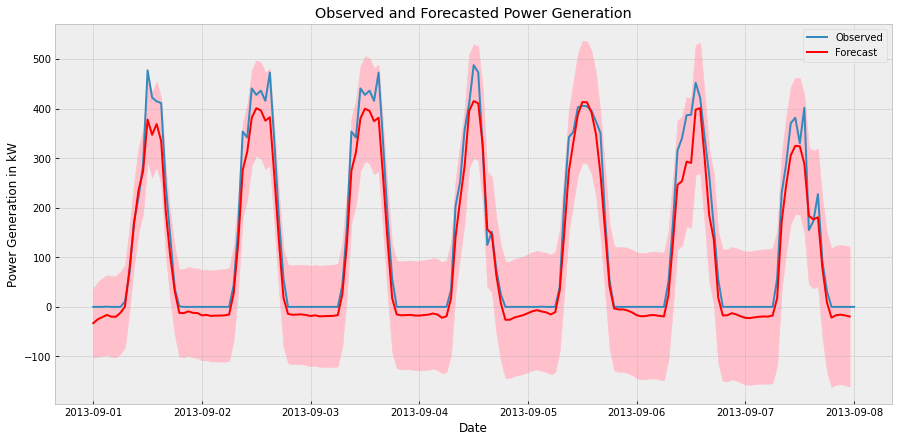

In [65]:
forecast('2013-09-01')

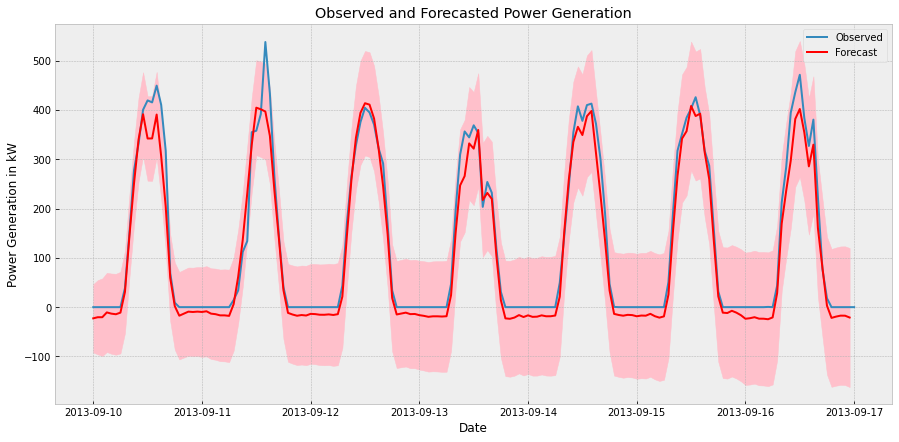

In [66]:
forecast('2013-09-10')

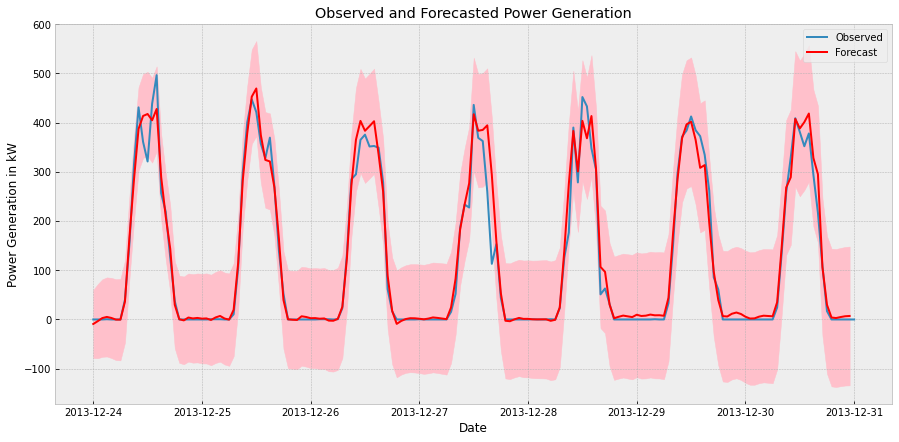

In [67]:
forecast('2013-12-24')